In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns

In [2]:
plt.rcParams['figure.dpi'] = 300
sns.set_context('talk', font_scale= 1.2)

# Figure 3A

In [9]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
umap_path = os.path.join(subsample_path, '20200508_maternal500_fetal_wo_outliers.csv')
adata_df = pd.read_csv(umap_path)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (42) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [10]:
clean_df = adata_df[(adata_df['test_status'] == 'test') & 
                    adata_df['organ'].isin(['PB', 'PL_F', 'PL_M'])]
bl_df = clean_df[(clean_df['challenge'] == 'sal') & (clean_df['timePI'] == '2hr') & (clean_df['origin'] == 'maternal')]

In [12]:
bl_df.columns

Index(['CD45-retroorbital', 'CD45.2', 'CD45.1', 'IdU', 'B220', 'Ly-6G',
       'CD11c', 'TCRb', 'CD115', 'CD69', 'F480', 'CD3', 'IgD', 'CD19', 'CD25',
       'CD64', 'CD80', 'CD8', 'CD11b', 'CD40', 'IgM', 'c-Kit', 'FOXP3',
       'TCRgd', 'CTLA-4', 'Ly-6C', 'CD194', 'CD62L', 'PD-L1', 'FcERI', 'NKp46',
       'Siglec-F', 'CD68', 'CD49b', 'CD44', 'CD4', 'PD-1', 'MHCII', 'CD86',
       'prpS6', 'day', 'organ', 'id', 'cage', 'timePI', 'challenge', 'origin',
       'location', 'leiden1', 'PD-L1_status', 'PD-1_status', 'CTLA-4_status',
       'CD64_status', 'CD62L_status', 'CD25_status', 'CD194_status',
       'CD69_status', 'CD80_status', 'CD86_status', 'B220_status',
       'CD40_status', 'CD44_status', 'IdU_status', 'cell_descript',
       'test_status', 'sample', 'cell_type', 'compartment', 'umap1', 'umap2',
       'cell_type_v2', 'compartment2'],
      dtype='object')

In [11]:
leiden_color_dictv2 = {'B cells': '#FFFF00',
 'CD4+ T cells': '#FF34FF',
 'CD8+ T cells': '#FF4A46',
 'Eosinophils': '#A30059',
 'Basophils': '#b98cdb',
 'Monocytes': '#552de3',
 'NK cells': '#8FB0FF',
 'Neutrophils': '#8393a3',                   
 'DCs': '#1CE6FF'}

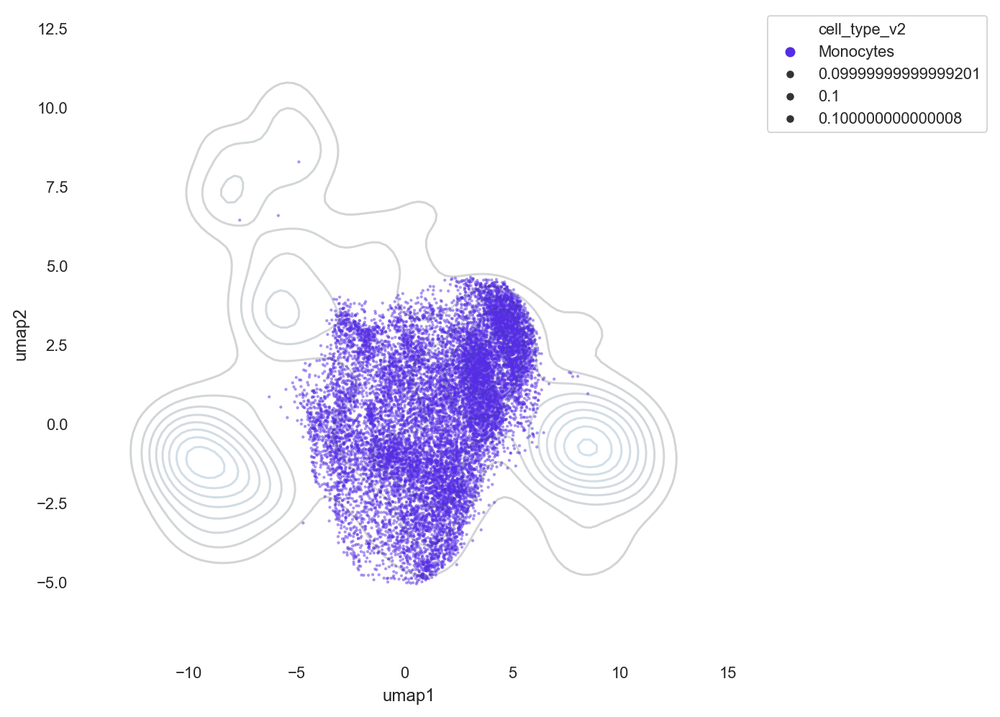

In [14]:
sns.set_context('paper', font_scale= 1)
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.kdeplot(data = bl_df['umap1'], data2= bl_df['umap2'], shade = False, 
            shade_lowest=False, ax = ax, alpha = 0.2, cbar = False)

sns.scatterplot(data = bl_df[bl_df['cell_type_v2']=='Monocytes'], 
                hue = 'cell_type_v2', palette = leiden_color_dictv2, x='umap1', y='umap2', marker='.', size = 0.1, 
                linewidth = 0, alpha = 0.5, ax = ax)
sns.despine(f, left=True, bottom=True)
sns.set_style("whitegrid", {'axes.grid' : False})
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [15]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
umap_csv = '20200514_umap_all_mo_comp.csv'
umap_filepath = os.path.join(subsample_path, umap_csv)
mono_df= pd.read_csv(umap_filepath)

In [16]:
mono_clean_df = mono_df[(mono_df['test_status'] == 'test') & mono_df['organ'].isin(['PB', 'PL_F', 'PL_M'])]

In [17]:
mono_df['Mo_leiden2'].unique()

array(['0', '5', '2', '1', '4', '3', '6', '5MHCII', '10', '8', '9', '7'],
      dtype=object)

In [6]:
Mo_leiden2_dict = {'0': '#d67c0d',
'1': '#32a852',
'2': '#876507',
'3': '#d6bcc0',
'4': '#023fa5',
'5': '#d60d0d',
'6': '#d60dcf',
'7': '#0dd6d3',
'8': '#772d91',
'9': '#d6d60d',
'10':'#c6e384',
'5MHCII': '#afb7c4'}

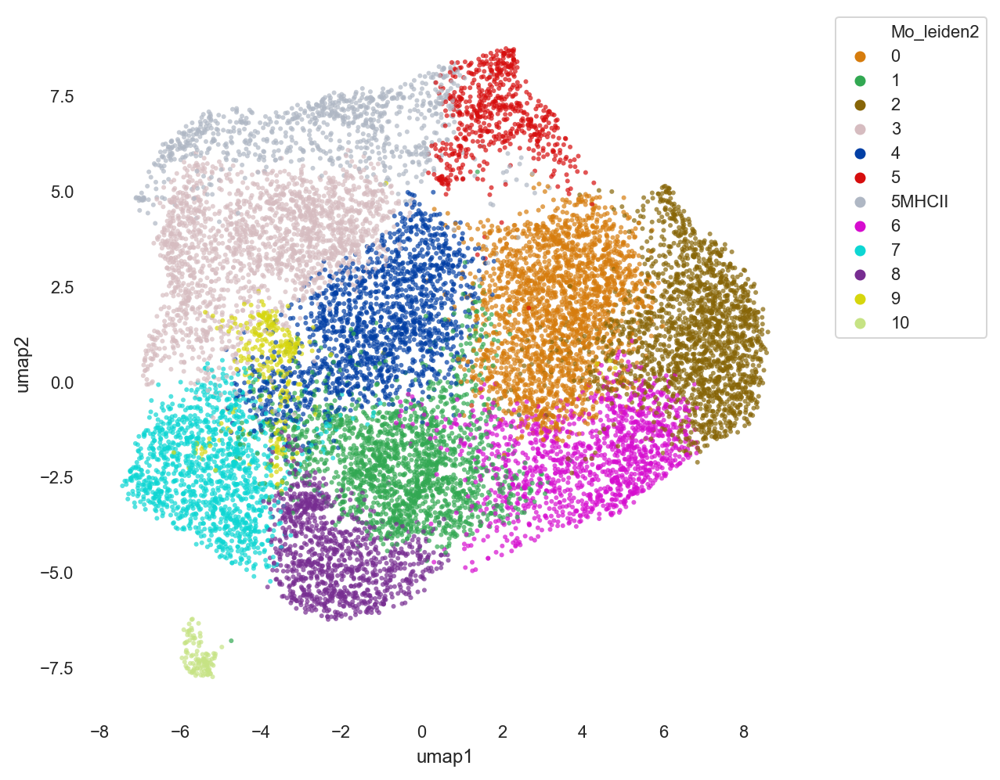

In [18]:
sns.set_context('paper', font_scale= 1)
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.scatterplot(x='umap1', y='umap2', 
                data = mono_clean_df, 
                hue = 'Mo_leiden2', hue_order = ['0', '1', '2', '3', '4', '5','5MHCII', '6', '7', '8', '9', '10'],
                palette = Mo_leiden2_dict, 
                marker='.', linewidth = 0, alpha = 0.7)
sns.set_style("whitegrid", {'axes.grid' : False})
sns.despine(f, left=True, bottom=True)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Figure 3b

In [19]:
clustering = ['IdU',
 'CD11c',
 'F480',
 'CD64',
 'CD68',
 'CD86',
 'CD80',
 'CD11b',
 'Ly-6C',
 'PD-L1',
 'MHCII']

In [20]:
mono_clean_df[clustering] = mono_clean_df[clustering].apply(lambda x:(x-x.min()) / (x.max()-x.min()))
mono_melt= mono_clean_df.melt(id_vars=['compartment2','Mo_leiden2', 'cage','id', 'day', 'umap1', 'umap2'], value_vars = clustering)
mono_melt.rename(columns = {'variable': 'marker', 'value': 'median'}, inplace = True)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


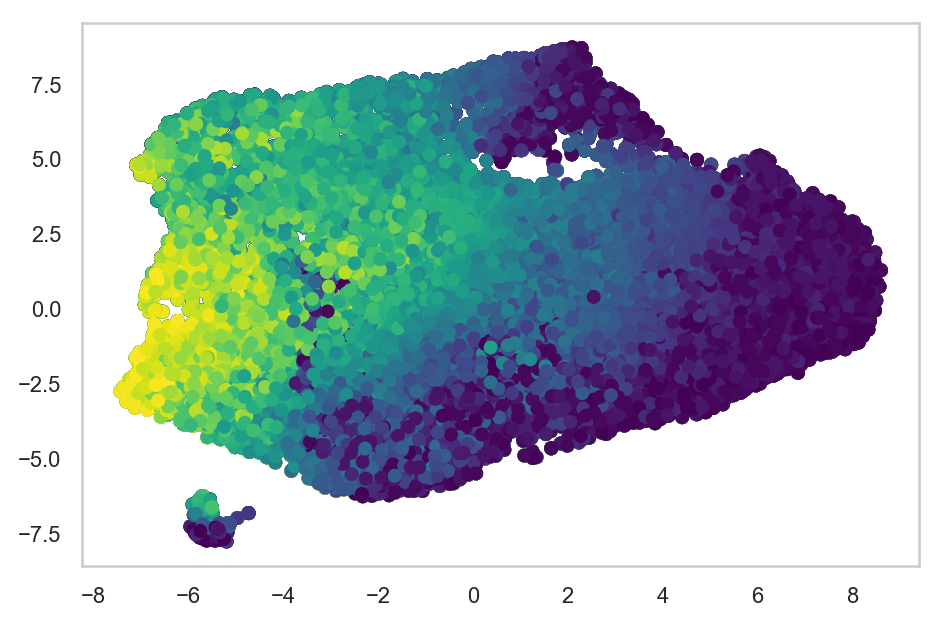

In [21]:
points = plt.scatter(mono_melt['umap1'], mono_melt['umap2'], c = mono_melt['median'], cmap='viridis')

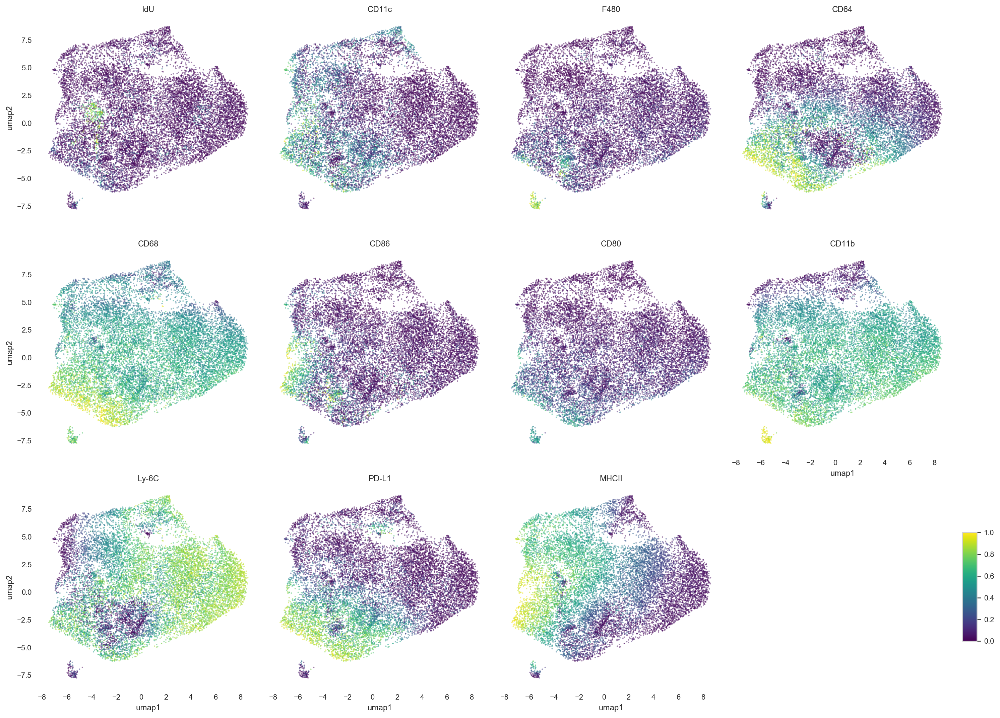

In [25]:
sns.set_context('paper', font_scale= 1)
g = sns.relplot(x='umap1', y= 'umap2', hue = 'median', col= 'marker', data= mono_melt,
                height=4, aspect=1, kind="scatter", palette = 'viridis', col_wrap=4,
                marker='.', size = 0.1, linewidth = 0, alpha = 0.5, legend = False).set_titles('{col_name}')
cax = g.fig.add_axes([1, .11, 0.015, 0.15])
plt.colorbar(points, cax=cax)
sns.despine(g, left=True, bottom=True)

# Figure 3c

In [26]:
columns_int = ['CD45-retroorbital', 'CD45.2', 'CD45.1', 'IdU', 'B220', 'Ly-6G',
       'CD11c', 'TCRb', 'CD115', 'CD69', 'F480', 'CD3', 'IgD', 'CD19', 'CD25',
       'CD64', 'CD80', 'CD8', 'CD11b', 'CD40', 'IgM', 'c-Kit', 'FOXP3',
       'TCRgd', 'CTLA-4', 'Ly-6C', 'CD194', 'CD62L', 'PD-L1', 'FcERI', 'NKp46',
       'Siglec-F', 'CD68', 'CD49b', 'CD44', 'CD4', 'PD-1', 'MHCII', 'CD86',
       'prpS6', 'cage','challenge', 'day', 'id', 'Mo_leiden2', 'compartment2']

In [81]:
mono_clean_df = mono_df[(mono_df['test_status'] == 'test') & mono_df['organ'].isin(['PB', 'PL_F', 'PL_M'])]
pivot_series = mono_clean_df[columns_int].pivot_table(columns= ['Mo_leiden2', 'compartment2','challenge', 'cage','id', 'day'], aggfunc = 'median')

In [82]:
median_df = pd.DataFrame(pivot_series)
median_df.reset_index(inplace = True)
median_df.rename(columns = {'level_0': 'marker', 0: 'median'}, inplace = True)
mean_medians = median_df.groupby(['marker','Mo_leiden2']).mean()
mean_medians.reset_index(inplace = True)
heatmap_df = mean_medians.pivot_table(index = 'marker', columns = 'Mo_leiden2', values = 'median')

In [83]:
heatmap_ready = heatmap_df.apply(lambda x:(x-x.min()) / (x.max()-x.min()), axis = 1)

In [84]:
heat_t = heatmap_ready.loc[:, ['0', '2', '6', '1', '8', '10', '3', '5MHCII', '5', '4', '9', '7']]

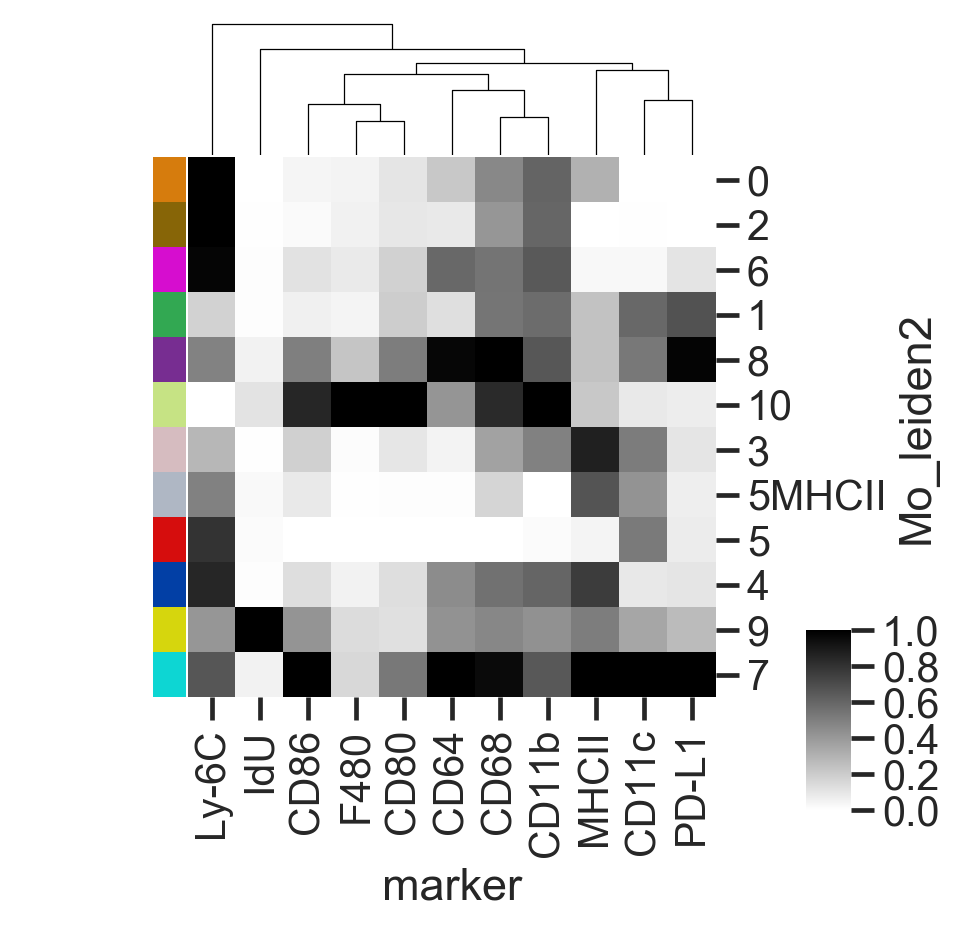

In [85]:
sns.set_context('talk', font_scale= 1)
row_colors = heat_t.columns.map(Mo_leiden2_dict)
cg = sns.clustermap(heat_t.loc[clustering, :].transpose(), figsize=(5,5),
               cmap = 'binary', row_colors = row_colors, 
               row_cluster = False, col_cluster = True)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
cg.cax.set_position((1,0.0,.05,.2))

In [49]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
counts_csv = '20200514_maternalmo_edited_counts_per_sample.csv'
counts_filepath = os.path.join(subsample_path, counts_csv)
cell_counts= pd.read_csv(counts_filepath) 

In [51]:
cell_counts['Mo_leiden2'].unique()

array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '5MHCII'],
      dtype=object)

In [52]:
clean_cell_counts = cell_counts[cell_counts['test_status'] == 'test']
clean_cell_counts['cage'] = clean_cell_counts['cage'].astype('category')
composite = clean_cell_counts.groupby(['Mo_leiden2', 'day','compartment2']).agg(['mean', 'sem'])
mean_sem_comp = composite.reorder_levels([1, 0], axis = 1)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [55]:
composite_frac_all = pd.DataFrame(data = mean_sem_comp['mean']['frac_of_comp_sample'])
composite_frac_all.reset_index(inplace = True)
heatmap_all = composite_frac_all.pivot_table(index = ['Mo_leiden2'], columns = 'compartment2', values = 'frac_of_comp_sample')
heatmap_all= heatmap_all.fillna(0)

In [57]:
heatmap_all=heatmap_all.loc[:,['PL-T', 'PL-EV', 'PB-EV']]

In [59]:
heat_counts = heatmap_all.loc[['0', '2', '6', '1', '8', '10', '3', '5MHCII', '5', '4', '9', '7'], :]

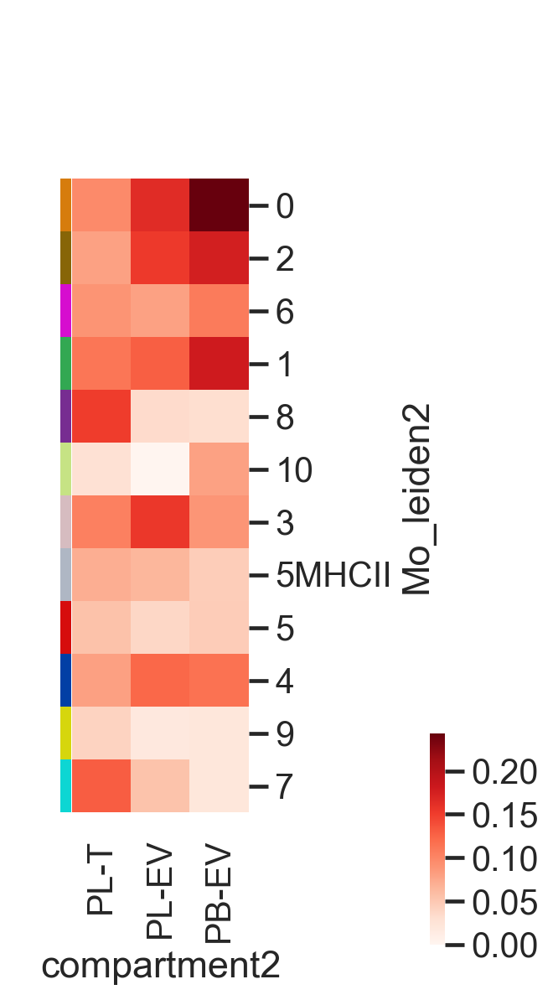

In [63]:
row_colors = heat_counts.index.map(Mo_leiden2_dict)
cg = sns.clustermap(heat_counts, figsize=(2, 7),
               cmap = 'Reds', row_colors = row_colors, 
               row_cluster = False, col_cluster = False)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
cg.cax.set_position((1.5,0.0,.05,.2))

# Figure 3D

In [100]:
median_df.head(5)

,marker,Mo_leiden2,compartment2,challenge,cage,id,day,median
0,CD45-retroorbital,0,PB-EV,sal,428,13,E18.5,4.881016
1,CD45-retroorbital,0,PB-EV,sal,428,14,E12.5,4.652807
2,CD45-retroorbital,0,PB-EV,sal,429,16,E18.5,4.747822
3,CD45-retroorbital,0,PB-EV,sal,429,19,E11.5,4.108524
4,CD45-retroorbital,0,PB-EV,sal,429,20,E18.5,4.456143


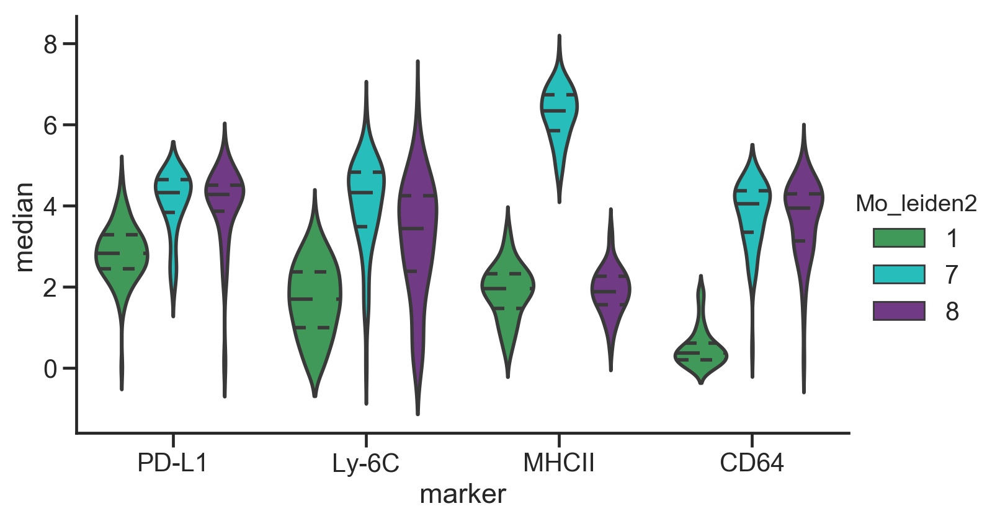

In [86]:
sns.set_style("ticks")
sns.catplot(x = 'marker', y = 'median', kind = 'violin',inner = 'quart',
            hue = 'Mo_leiden2', palette = Mo_leiden2_dict, order = ['PD-L1', 'Ly-6C','MHCII', 'CD64'],
            scale='count', ci = 68, data = median_df[median_df['marker'].isin(['PD-L1', 'Ly-6C','MHCII', 'CD64']) & median_df['Mo_leiden2'].isin(['1', '7', '8'])],
            legend_out = True, aspect = 1.6, height = 5)

In [98]:
from scipy.stats import ttest_ind

In [102]:
t_test_data = pd.DataFrame(columns =['cluster1', 'cluster2', 'marker','t-stat', 'p-value', 'Stat diff'])

In [101]:
leiden_combos = [('1', '7'), ('1', '8'), ('7', '8')]

In [103]:
for leiden_comb in leiden_combos:
    for marker in ['PD-L1', 'Ly-6C','MHCII', 'CD64']:
    
            marker_leiden1 = median_df[(median_df['marker']== marker) & 
                                    (median_df['Mo_leiden2']== leiden_comb[0])]
            marker_leiden2 = median_df[(median_df['marker']== marker) & 
                                    (median_df['Mo_leiden2']== leiden_comb[1])]

            t_stat, p = ttest_ind(marker_leiden1['median'], marker_leiden2['median'])
            alpha = 0.05
            if p > alpha:
                dist = 'no'
            else:
                dist = 'yes'
            data_df = pd.DataFrame(data ={'cluster1': [leiden_comb[0]],
                                          'cluster2': [leiden_comb[1]],
                                          'marker': [marker], 
                                          't-stat': [t_stat], 
                                          'p-value': [p], 
                                          'Stat diff':[ dist]})
            t_test_data = t_test_data.append(data_df)

In [104]:
t_test_data

,cluster1,cluster2,marker,t-stat,p-value,Stat diff
0,1,7,PD-L1,-11.101600,6.159059e-22,yes
0,1,7,Ly-6C,-15.347992,4.782764e-34,yes
0,1,7,MHCII,-43.293800,2.058243e-94,yes
0,1,7,CD64,-33.989958,3.111213e-78,yes
0,1,8,PD-L1,-9.544727,1.161722e-17,yes
0,1,8,Ly-6C,-8.677824,2.643618e-15,yes
0,1,8,MHCII,-0.089590,9.287151e-01,no
0,1,8,CD64,-30.247283,1.248561e-71,yes
0,7,8,PD-L1,0.492645,6.230137e-01,no
0,7,8,Ly-6C,3.900897,1.465705e-04,yes


# Figure 3E

In [69]:
PB = mono_clean_df[mono_clean_df['compartment2'] == 'PB-EV']
EV = mono_clean_df[mono_clean_df['compartment2'] == 'PL-EV']
TIS =mono_clean_df[mono_clean_df['compartment2']=='PL-T']

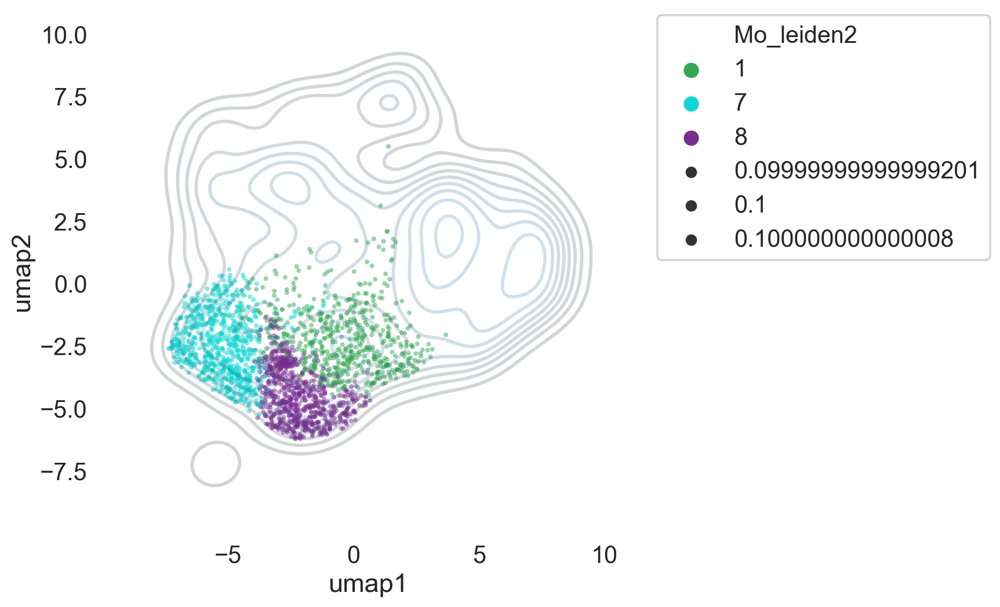

In [71]:
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.kdeplot(data = mono_clean_df['umap1'], data2= mono_clean_df['umap2'], shade = False, 
            shade_lowest=False, ax = ax, alpha = 0.2, cbar = False)
sns.scatterplot(data = TIS[TIS['Mo_leiden2'].isin(['1', '7', '8'])], hue = 'Mo_leiden2', palette = Mo_leiden2_dict, x='umap1', y='umap2', marker='.', size = 0.1, linewidth = 0, alpha = 0.5, ax = ax)
sns.despine(f, left=True, bottom=True)
sns.set_style("whitegrid", {'axes.grid' : False})
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

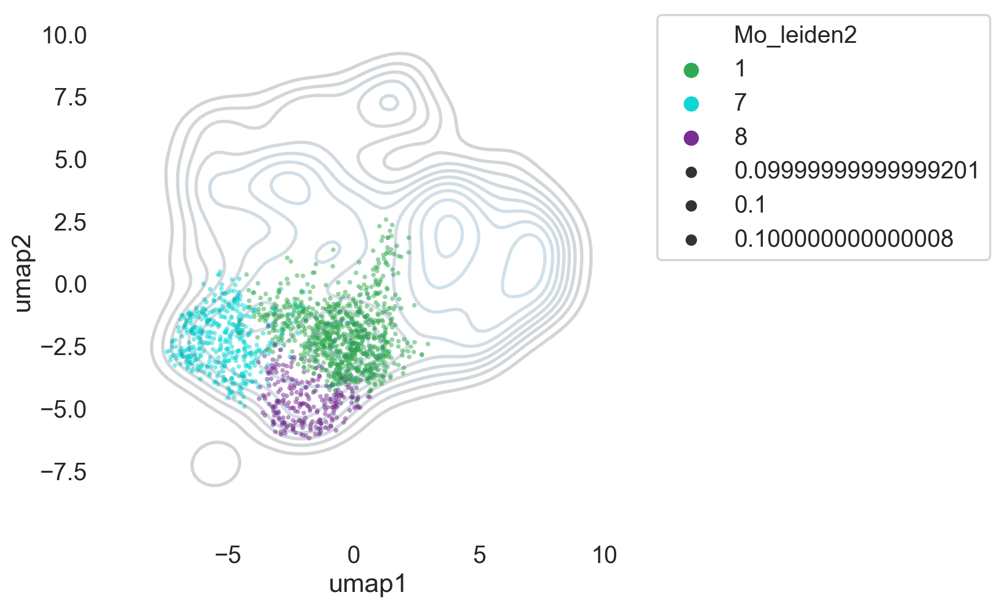

In [70]:
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.kdeplot(data = mono_clean_df['umap1'], data2= mono_clean_df['umap2'], shade = False, 
            shade_lowest=False, ax = ax, alpha = 0.2, cbar = False)
sns.scatterplot(data = EV[EV['Mo_leiden2'].isin(['1', '7', '8'])], hue = 'Mo_leiden2', palette = Mo_leiden2_dict, x='umap1', y='umap2', marker='.', size = 0.1, linewidth = 0, alpha = 0.5, ax = ax)
sns.despine(f, left=True, bottom=True)
sns.set_style("whitegrid", {'axes.grid' : False})
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

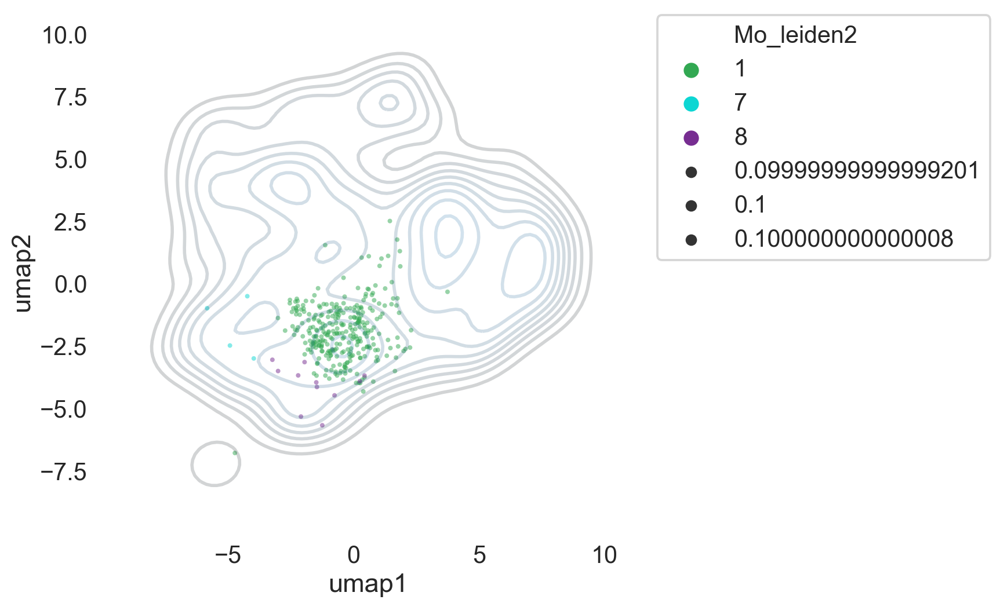

In [72]:
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.kdeplot(data = mono_clean_df['umap1'], data2= mono_clean_df['umap2'], shade = False, 
            shade_lowest=False, ax = ax, alpha = 0.2, cbar = False)
sns.scatterplot(data = PB[PB['Mo_leiden2'].isin(['1', '7', '8'])], hue = 'Mo_leiden2', palette = Mo_leiden2_dict, x='umap1', y='umap2', marker='.', size = 0.1, linewidth = 0, alpha = 0.5, ax = ax)
sns.despine(f, left=True, bottom=True)
sns.set_style("whitegrid", {'axes.grid' : False})
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Figure 3F

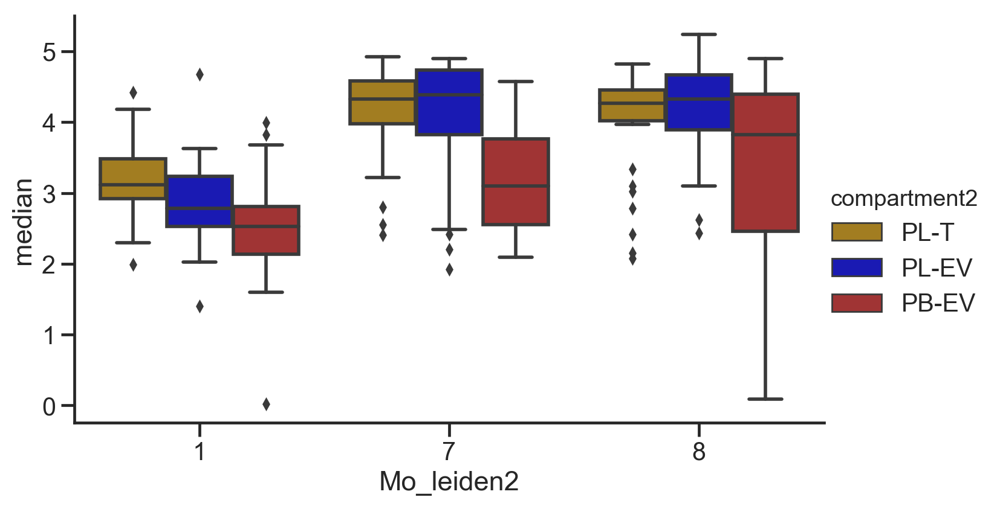

In [91]:
sns.catplot(x = 'Mo_leiden2', y = 'median', kind = 'box', hue_order = ['PL-T', 'PL-EV', 'PB-EV'],
            hue = 'compartment2', palette = {'PB-EV':'firebrick', 'PL-EV': 'mediumblue', 'PL-T': 'darkgoldenrod'},
            ci = 68, data = median_df[median_df['marker'].isin(['PD-L1']) & median_df['Mo_leiden2'].isin(['1', '7', '8'])],
            legend_out = True, aspect = 1.6, height = 5)

In [ ]:
from scipy.stats import ttest_ind

In [109]:
median_df.head(5)

,marker,Mo_leiden2,compartment2,challenge,cage,id,day,median
0,CD45-retroorbital,0,PB-EV,sal,428,13,E18.5,4.881016
1,CD45-retroorbital,0,PB-EV,sal,428,14,E12.5,4.652807
2,CD45-retroorbital,0,PB-EV,sal,429,16,E18.5,4.747822
3,CD45-retroorbital,0,PB-EV,sal,429,19,E11.5,4.108524
4,CD45-retroorbital,0,PB-EV,sal,429,20,E18.5,4.456143


In [110]:
pdl1_medians = median_df[median_df['marker'] == 'PD-L1']

In [116]:
t_test_pdl1 = pd.DataFrame(columns =['comp1', 'comp2', 'cluster','t-stat', 'p-value', 'Stat diff'])

In [117]:
combos = [('PL-T', 'PL-EV'), ('PL-T', 'PB-EV'),('PL-EV', 'PB-EV')]

In [118]:
for comb in combos:
    for cluster in ['1', '7','8']:
    
            comp1 = pdl1_medians[(pdl1_medians['Mo_leiden2']== cluster) & 
                                    (pdl1_medians['compartment2']== comb[0])]
            comp2 = pdl1_medians[(pdl1_medians['Mo_leiden2']== cluster) & 
                                    (pdl1_medians['compartment2']== comb[1])]

            t_stat, p = ttest_ind(comp1['median'], comp2['median'])
            alpha = 0.05
            if p > alpha:
                dist = 'no'
            else:
                dist = 'yes'
            data_df = pd.DataFrame(data ={'comp1': [comb[0]],
                                          'comp2': [comb[1]],
                                          'cluster': [cluster], 
                                          't-stat': [t_stat], 
                                          'p-value': [p], 
                                          'Stat diff':[ dist]})
            t_test_pdl1 = t_test_pdl1.append(data_df)

In [119]:
t_test_pdl1 

,comp1,comp2,cluster,t-stat,p-value,Stat diff
0,PL-T,PL-EV,1,2.496705,0.015039,yes
0,PL-T,PL-EV,7,0.519611,0.605100,no
0,PL-T,PL-EV,8,-1.248189,0.216439,no
0,PL-T,PB-EV,1,4.621998,0.000018,yes
0,PL-T,PB-EV,7,2.690579,0.010747,yes
0,PL-T,PB-EV,8,2.148677,0.037767,yes
0,PL-EV,PB-EV,1,2.329360,0.022863,yes
0,PL-EV,PB-EV,7,1.922690,0.062687,no
0,PL-EV,PB-EV,8,2.733160,0.009380,yes


# Figure 3G

In [143]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
pdl1_clustcounts_csv = '20200819_maternalmo_pdl1_clust_counts_per_sample.csv'
pdl1_clustcounts_filepath = os.path.join(subsample_path, pdl1_clustcounts_csv)
pdl1_clust = pd.read_csv(pdl1_clustcounts_filepath)  

In [144]:
pdl1_clust.head(5)

,clust_comb,compartment2,organ,location,day,challenge,timePI,cage,id,test_status,counts,sample,sample_total,frac_of_comp_sample,full_sample_total,frac_of_immune,PDL1_status,pdl1_counts,frac_of_pdl1_pos
0,1,PB-EV,PB,EV,E10.5,sal,2hr,6942,8,test,8,6942_8_E10.5_sal_2hr_PB_EV,60,0.133333,494.0,0.016194,pos,9,0.888889
1,1,PB-EV,PB,EV,E10.5,sal,2hr,6943,15,test,9,6943_15_E10.5_sal_2hr_PB_EV,62,0.145161,484.0,0.018595,pos,11,0.818182
2,1,PB-EV,PB,EV,E10.5,sal,2hr,6944,16,test,14,6944_16_E10.5_sal_2hr_PB_EV,67,0.208955,496.0,0.028226,pos,15,0.933333
3,1,PB-EV,PB,EV,E10.5,sal,2hr,6944,17,test,5,6944_17_E10.5_sal_2hr_PB_EV,32,0.156250,485.0,0.010309,pos,5,1.000000
4,1,PB-EV,PB,EV,E10.5,sal,2hr,9582,15,test,11,9582_15_E10.5_sal_2hr_PB_EV,36,0.305556,459.0,0.023965,pos,11,1.000000


In [145]:
pdl1_clust['clust_comb'] = pdl1_clust['clust_comb'].astype('str')

In [146]:
int_days = ['E10.5', 'E14.5', 'E18.5']

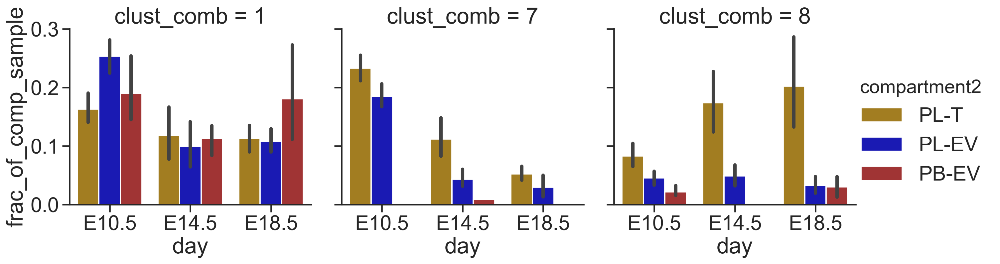

In [95]:
sns.set_context('talk', font_scale= 1.5)
g = sns.catplot(x='day', y='frac_of_comp_sample',
                col='clust_comb', data= pdl1_clust[pdl1_clust['day'].isin(int_days)], 
                kind='bar', hue = 'compartment2',hue_order = ['PL-T', 'PL-EV', 'PB-EV'],
                palette= {'PL-EV': 'mediumblue', 'PL-T': 'darkgoldenrod', 'PB-EV':'firebrick',}, sharey = True,
                height=5, aspect=1)

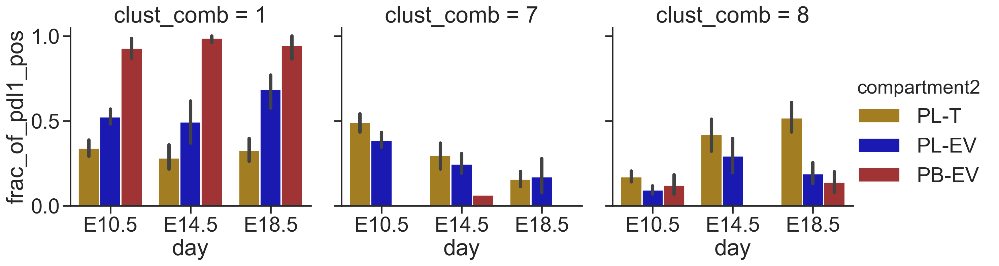

In [97]:
sns.set_context('talk', font_scale= 1.5)
g = sns.catplot(x='day', y='frac_of_pdl1_pos',
                col='clust_comb', data=  pdl1_clust[pdl1_clust['day'].isin(int_days)], 
                kind='bar', hue = 'compartment2',hue_order = ['PL-T', 'PL-EV', 'PB-EV'],
                palette= {'PL-EV': 'mediumblue', 'PL-T': 'darkgoldenrod', 'PB-EV':'firebrick',}, sharey = True,
                height=5, aspect=1)

In [158]:
days = [('E10.5', 'E14.5'), ('E14.5', 'E18.5'), ('E18.5', 'E10.5')]
combos = [('PL-T', 'PL-EV'), ('PL-EV', 'PB-EV'), ('PB-EV', 'PL-T')]
t_test_pdl1_frac = pd.DataFrame(columns =['cluster', 'comp_only','day1', 'day2', 't-stat_day', 'p-value_day', 'Stat diff day', 'comp1', 'comp2', 'day_only', 't-stat_comp', 'p-value_comp', 'Stat diff comp'])

for cluster in ['1', '7','8']:   
    for comb in combos:
        for day in days: 
                day1 = pdl1_clust[(pdl1_clust['clust_comb']== cluster) & 
                                        (pdl1_clust['compartment2']== comb[0])&
                                        (pdl1_clust['day']== day[0])]
                day2 = pdl1_clust[(pdl1_clust['clust_comb']== cluster) & 
                                        (pdl1_clust['compartment2']== comb[0])&
                                        (pdl1_clust['day']== day[1])]

                t_stat_day, p_day = ttest_ind(day1['frac_of_pdl1_pos'], day2['frac_of_pdl1_pos'])
                alpha = 0.05
                if p_day > alpha:
                    dist_day = 'no'
                else:
                    dist_day = 'yes'

                comp_1 = pdl1_clust[(pdl1_clust['clust_comb']== cluster) & 
                                        (pdl1_clust['compartment2']== comb[0])&
                                        (pdl1_clust['day']== day[0])]
                comp_2 = pdl1_clust[(pdl1_clust['clust_comb']== cluster) & 
                                        (pdl1_clust['compartment2']== comb[1])&
                                        (pdl1_clust['day']== day[0])]

                t_stat_comp, p_comp = ttest_ind(comp_1['frac_of_pdl1_pos'], comp_2['frac_of_pdl1_pos'])
                alpha = 0.05
                if p_comp > alpha:
                    dist_comp = 'no'
                else:
                    dist_comp = 'yes'


                data_df = pd.DataFrame(data ={'cluster': [cluster],
                                              'comp_only': [comb[0]],
                                              'day1':[day[0]],
                                              'day2':[day[1]],
                                              't-stat_day': [t_stat_day], 
                                              'p-value_day': [p_day], 
                                              'Stat diff day':[ dist_day],
                                              'comp1': [comb[0]],
                                              'comp2': [comb[1]],
                                              'day_only':[day[0]],
                                              't-stat_comp': [t_stat_comp], 
                                              'p-value_comp': [p_comp], 
                                              'Stat diff comp':[ dist_comp]})
                t_test_pdl1_frac = t_test_pdl1_frac.append(data_df)

In [163]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
pdl1_cluststats_csv = '20200901_maternalmo_pdl1_clust_counts_stats.csv'
pdl1_cluststats_filepath = os.path.join(subsample_path, pdl1_cluststats_csv) 
t_test_pdl1_frac.to_csv(pdl1_cluststats_filepath, index = False)

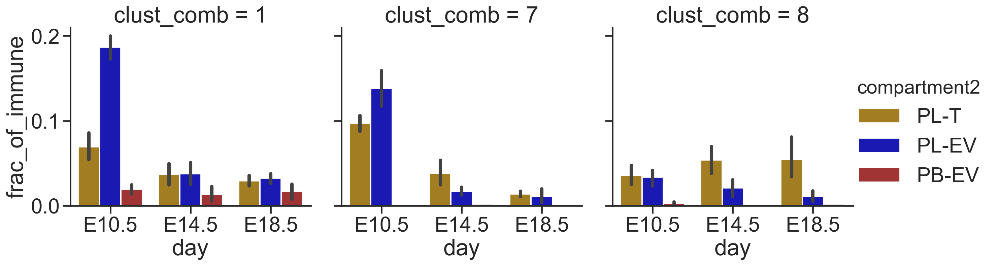

In [96]:
sns.set_context('talk', font_scale= 1.5)
g = sns.catplot(x='day', y='frac_of_immune',
                col='clust_comb', data= pdl1_clust[pdl1_clust['day'].isin(int_days)], 
                kind='bar', hue = 'compartment2',hue_order = ['PL-T', 'PL-EV', 'PB-EV'],
                palette= {'PL-EV': 'mediumblue', 'PL-T': 'darkgoldenrod', 'PB-EV':'firebrick',}, sharey = True,
                height=5, aspect=1)

In [160]:
days = [('E10.5', 'E14.5'), ('E14.5', 'E18.5'), ('E18.5', 'E10.5')]
combos = [('PL-T', 'PL-EV'), ('PL-EV', 'PB-EV'), ('PB-EV', 'PL-T')]
t_test_immune_frac = pd.DataFrame(columns =['cluster', 'comp_only','day1', 'day2', 't-stat_day', 'p-value_day', 'Stat diff day', 'comp1', 'comp2', 'day_only', 't-stat_comp', 'p-value_comp', 'Stat diff comp'])

for cluster in ['1', '7','8']:   
    for comb in combos:
        for day in days: 
                day1 = pdl1_clust[(pdl1_clust['clust_comb']== cluster) & 
                                        (pdl1_clust['compartment2']== comb[0])&
                                        (pdl1_clust['day']== day[0])]
                day2 = pdl1_clust[(pdl1_clust['clust_comb']== cluster) & 
                                        (pdl1_clust['compartment2']== comb[0])&
                                        (pdl1_clust['day']== day[1])]

                t_stat_day, p_day = ttest_ind(day1['frac_of_immune'], day2['frac_of_immune'])
                alpha = 0.05
                if p_day > alpha:
                    dist_day = 'no'
                else:
                    dist_day = 'yes'

                comp_1 = pdl1_clust[(pdl1_clust['clust_comb']== cluster) & 
                                        (pdl1_clust['compartment2']== comb[0])&
                                        (pdl1_clust['day']== day[0])]
                comp_2 = pdl1_clust[(pdl1_clust['clust_comb']== cluster) & 
                                        (pdl1_clust['compartment2']== comb[1])&
                                        (pdl1_clust['day']== day[0])]

                t_stat_comp, p_comp = ttest_ind(comp_1['frac_of_pdl1_pos'], comp_2['frac_of_pdl1_pos'])
                alpha = 0.05
                if p_comp > alpha:
                    dist_comp = 'no'
                else:
                    dist_comp = 'yes'


                data_df = pd.DataFrame(data ={'cluster': [cluster],
                                              'comp_only': [comb[0]],
                                              'day1':[day[0]],
                                              'day2':[day[1]],
                                              't-stat_day': [t_stat_day], 
                                              'p-value_day': [p_day], 
                                              'Stat diff day':[ dist_day],
                                              'comp1': [comb[0]],
                                              'comp2': [comb[1]],
                                              'day_only':[day[0]],
                                              't-stat_comp': [t_stat_comp], 
                                              'p-value_comp': [p_comp], 
                                              'Stat diff comp':[ dist_comp]})
                t_test_immune_frac = t_test_immune_frac.append(data_df)

In [165]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
immune_cluststats_csv = '20200901_maternalmo_pdl1_ouof_immune_counts_stats.csv'
immune_cluststats_filepath = os.path.join(subsample_path, immune_cluststats_csv) 
t_test_immune_frac.to_csv(immune_cluststats_filepath, index = False)